To get hands-on linear regression we will take an original dataset and apply the concepts that we have learned.

We will take the Housing dataset which contains information about different houses in Boston. This data was originally a part of UCI Machine Learning Repository and has been removed now. We can also access this data from the scikit-learn library or Kaggle. The objective is to predict the value of prices of the house using the given features.

Dataset:

load the housing data from the scikit-learn library using load_boston. Or you can find the dataset in the data folder.

The prices of the house indicated by the variable MEDV is our target variable and the remaining are the feature variables based on which we will predict the value of a house.

Feature Description:

 

CRIM: Per capita crime rate by town
ZN: Proportion of residential land zoned for lots over 25,000 sq. ft
INDUS: Proportion of non-retail business acres per town
CHAS: Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
NOX: Nitric oxide concentration (parts per 10 million)
RM: Average number of rooms per dwelling
AGE: Proportion of owner-occupied units built prior to 1940
DIS: Weighted distances to five Boston employment centers
RAD: Index of accessibility to radial highways
TAX: Full-value property tax rate per $10,000
PTRATIO: Pupil-teacher ratio by town
B: 1000(Bk — 0.63)², where Bk is the proportion of [people of African American descent] by town
LSTAT: Percentage of lower status of the population
MEDV: Median value of owner-occupied homes in $1000s


Guidance:

These are the following steps which can be performed on this data :

l  Understand the data

l  Clean the data ( handle missing data and outliers)

l  Create new features from existing data

l  Remove unused features

l  Perform Scaling and transformations

l  Do some exploratory analysis and see whether any interest things to get from data.

l  Prepare data for training model

l  Train the model and evaluate using validation dataset.

l  Once you are satisfied with the trained model, predict the data using test dataset.

l  Try to plot performance metrics and rest is can be done by individual knowledge of the person.

 

Feel free to apply other learned techniques.

In [1]:
import pandas as pd
import seaborn as sns
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt

In [4]:
from sklearn import preprocessing
from sklearn.model_selection import KFold
from sklearn.linear_model import LinearRegression

In [5]:
df =  pd.read_csv('../data/boston-housing/boston.csv')
df.head()

,ID,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,1,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,2,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,4,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
3,5,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
4,7,0.08829,12.5,7.87,0,0.524,6.012,66.6,5.5605,5,311,15.2,395.60,12.43,22.9


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 333 entries, 0 to 332
Data columns (total 15 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   ID       333 non-null    int64  
 1   crim     333 non-null    float64
 2   zn       333 non-null    float64
 3   indus    333 non-null    float64
 4   chas     333 non-null    int64  
 5   nox      333 non-null    float64
 6   rm       333 non-null    float64
 7   age      333 non-null    float64
 8   dis      333 non-null    float64
 9   rad      333 non-null    int64  
 10  tax      333 non-null    int64  
 11  ptratio  333 non-null    float64
 12  black    333 non-null    float64
 13  lstat    333 non-null    float64
 14  medv     333 non-null    float64
dtypes: float64(11), int64(4)
memory usage: 39.1 KB


In [6]:
df.describe()

,ID,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
count,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000,333.000000
mean,250.951952,3.360341,10.689189,11.293483,0.060060,0.557144,6.265619,68.226426,3.709934,9.633634,409.279279,18.448048,359.466096,12.515435,22.768769
std,147.859438,7.352272,22.674762,6.998123,0.237956,0.114955,0.703952,28.133344,1.981123,8.742174,170.841988,2.151821,86.584567,7.067781,9.173468
min,1.000000,0.006320,0.000000,0.740000,0.000000,0.385000,3.561000,6.000000,1.129600,1.000000,188.000000,12.600000,3.500000,1.730000,5.000000
25%,123.000000,0.078960,0.000000,5.130000,0.000000,0.453000,5.884000,45.400000,2.122400,4.000000,279.000000,17.400000,376.730000,7.180000,17.400000
50%,244.000000,0.261690,0.000000,9.900000,0.000000,0.538000,6.202000,76.700000,3.092300,5.000000,330.000000,19.000000,392.050000,10.970000,21.600000
75%,377.000000,3.678220,12.500000,18.100000,0.000000,0.631000,6.595000,93.800000,5.116700,24.000000,666.000000,20.200000,396.240000,16.420000,25.000000
max,506.000000,73.534100,100.000000,27.740000,1.000000,0.871000,8.725000,100.000000,10.710300,24.000000,711.000000,21.200000,396.900000,37.970000,50.000000


C:\Users\Admin\AppData\Local\Programs\Python\Python38\lib\site-packages\pandas\plotting\_matplotlib\tools.py:400: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():


array([[<AxesSubplot:title={'center':'ID'}>,
        <AxesSubplot:title={'center':'crim'}>,
        <AxesSubplot:title={'center':'zn'}>,
        <AxesSubplot:title={'center':'indus'}>],
       [<AxesSubplot:title={'center':'chas'}>,
        <AxesSubplot:title={'center':'nox'}>,
        <AxesSubplot:title={'center':'rm'}>,
        <AxesSubplot:title={'center':'age'}>],
       [<AxesSubplot:title={'center':'dis'}>,
        <AxesSubplot:title={'center':'rad'}>,
        <AxesSubplot:title={'center':'tax'}>,
        <AxesSubplot:title={'center':'ptratio'}>],
       [<AxesSubplot:title={'center':'black'}>,
        <AxesSubplot:title={'center':'lstat'}>,
        <AxesSubplot:title={'center':'medv'}>, <AxesSubplot:>]],
      dtype=object)

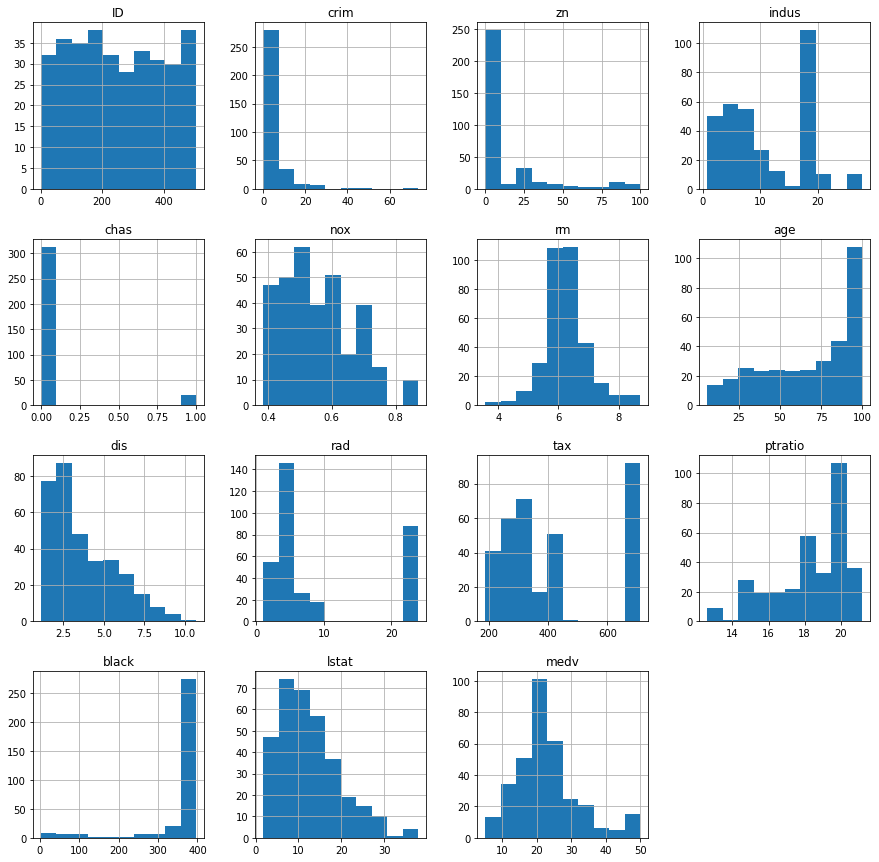

In [6]:
df.hist(figsize=(15,15))

In [7]:
df.mean()/df.max()

ID         0.495952
crim       0.045698
zn         0.106892
indus      0.407119
chas       0.060060
nox        0.639660
rm         0.718122
age        0.682264
dis        0.346389
rad        0.401401
tax        0.575639
ptratio    0.870191
black      0.905684
lstat      0.329614
medv       0.455375
dtype: float64

In [8]:
df.isnull().values.any()

False

In [9]:
#define the standard deviation
std_dev = 3
#zscore are the data values standardized by mean and standard deviation of input array df
df_new = df[(np.abs(stats.zscore(df)) < float(std_dev)).all(axis=1)]

In [24]:
df_new.describe()

,ID,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
count,268.000000,268.000000,268.000000,268.000000,268.0,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000
mean,240.268657,2.395381,7.208955,11.174440,0.0,0.552548,6.252929,67.841045,3.711029,8.858209,396.388060,18.516418,378.623433,12.134552,22.568284
std,152.074797,4.671760,15.113218,6.913644,0.0,0.107884,0.610582,27.843562,1.831221,8.275367,164.874707,2.097071,40.404764,6.271175,8.060274
min,1.000000,0.006320,0.000000,1.250000,0.0,0.389000,4.368000,6.000000,1.169100,1.000000,188.000000,13.000000,100.190000,1.730000,5.600000
25%,108.750000,0.086963,0.000000,5.190000,0.0,0.460000,5.879750,45.775000,2.257400,4.000000,277.000000,17.400000,379.272500,7.390000,17.800000
50%,229.000000,0.222330,0.000000,8.560000,0.0,0.535000,6.168000,74.700000,3.175750,5.000000,311.000000,19.000000,392.710000,10.875000,21.450000
75%,367.500000,2.318172,0.000000,18.100000,0.0,0.614000,6.546750,93.325000,5.100400,8.000000,437.000000,20.200000,396.900000,15.730000,24.625000
max,506.000000,25.046100,75.000000,27.740000,0.0,0.871000,8.337000,100.000000,9.222900,24.000000,711.000000,21.200000,396.900000,31.990000,50.000000


<AxesSubplot:>

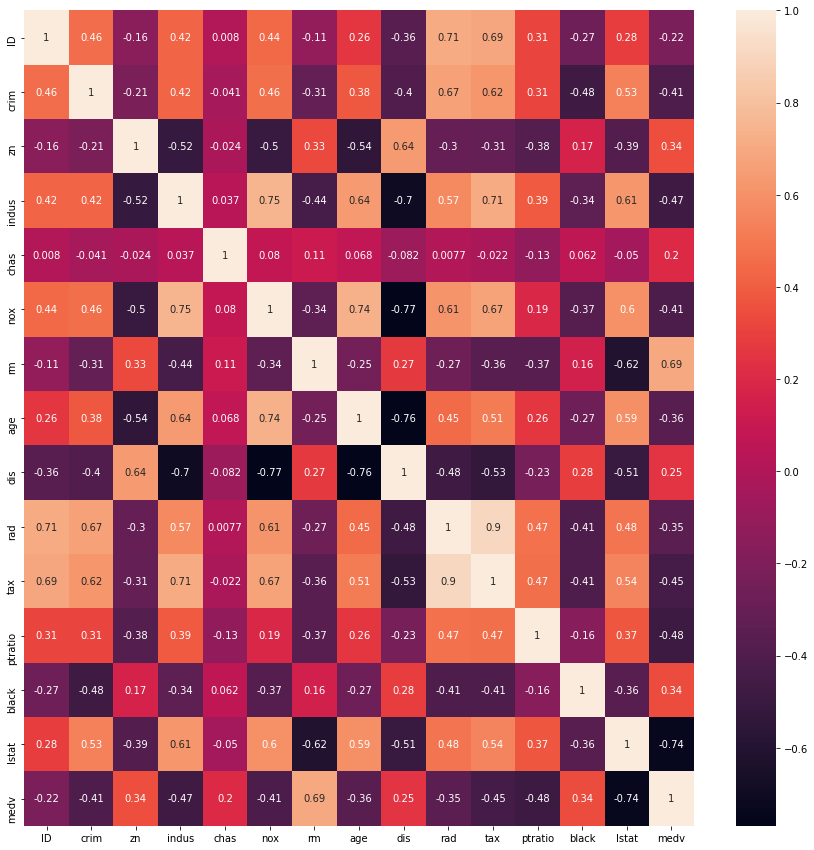

In [27]:
plt.subplots(figsize=(15,15))
sns.heatmap(df.corr(),annot=True)

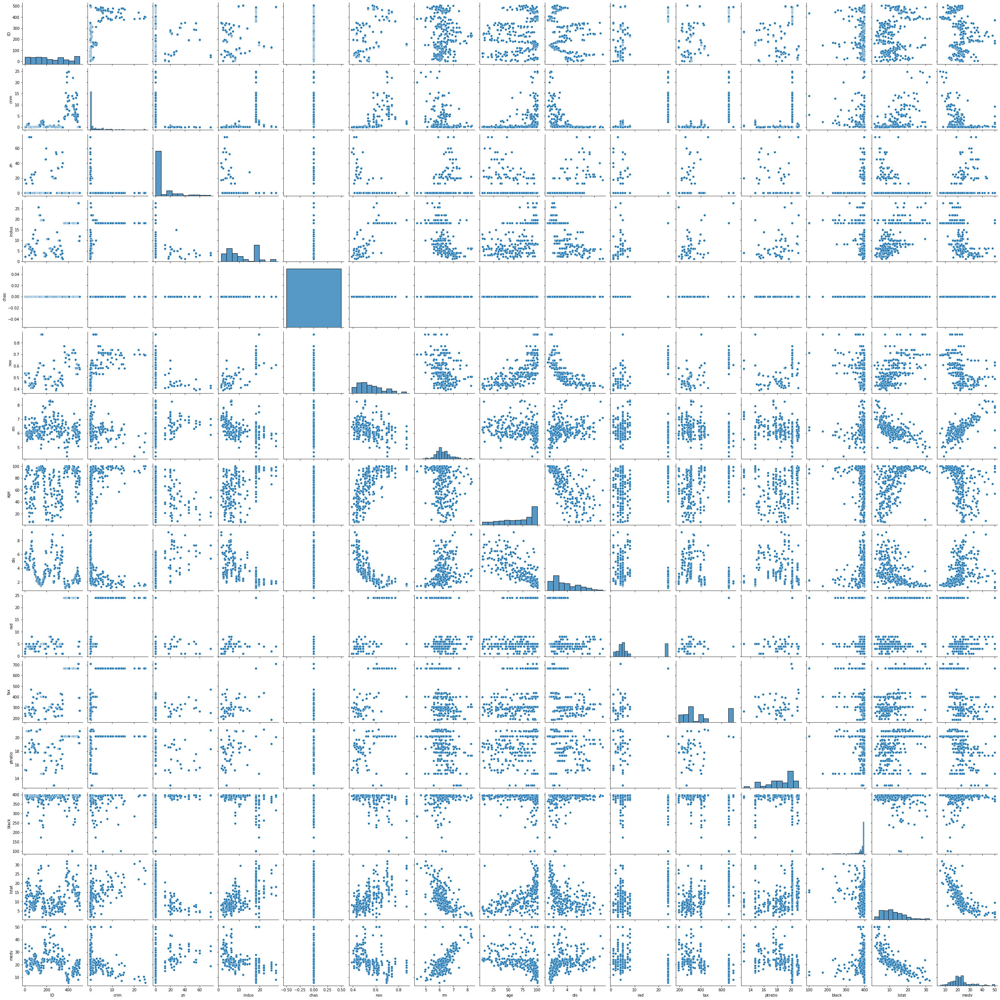

In [11]:
sns.pairplot(df_new,x)

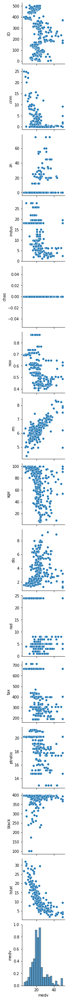

In [15]:
sns.pairplot(df_new,x_vars=['medv'])

In [13]:
X = pd.DataFrame(df['rm'])
y = pd.DataFrame(df['medv'])

model = LinearRegression()
scores = []

# shuffle = True, shuffles the data before splitting into batches
kfold = KFold(n_splits=3, shuffle=True, random_state=42)

for i, (train, test) in enumerate(kfold.split(X, y)):
    model.fit(X.iloc[train,:], y.iloc[train,:])
    score = model.score(X.iloc[test,:], y.iloc[test,:])
    scores.append(score)

print(scores)

[0.5032065867242357, 0.48439334630988806, 0.3903592570057335]


In [10]:
#medv ~ rm
x,y = pd.DataFrame(df['rm']),df['medv']
SLR = LinearRegression()
SLR.fit(x,y)

LinearRegression()

In [22]:
X = pd.DataFrame(df.loc[:,df.columns != 'medv'])
y = pd.DataFrame(df['medv'])

model = LinearRegression()
scores = []

# shuffle = True, shuffles the data before splitting into batches
kfold = KFold(n_splits=3, shuffle=True, random_state=42)

for i, (train, test) in enumerate(kfold.split(X, y)):
    model.fit(X.iloc[train,:], y.iloc[train,:])
    score = model.score(X.iloc[test,:], y.iloc[test,:])
    scores.append(score)

print(scores)

[0.7448392663336958, 0.6584752399595306, 0.6415969866316478]


In [28]:
from sklearn.preprocessing import StandardScaler

In [29]:
df_scaled = StandardScaler().fit_transform(df)

In [30]:
X = pd.DataFrame(df.loc[:,df.columns != 'medv'])
y = pd.DataFrame(df['medv'])

model = LinearRegression()
scores = []

# shuffle = True, shuffles the data before splitting into batches
kfold = KFold(n_splits=3, shuffle=True, random_state=42)

for i, (train, test) in enumerate(kfold.split(X, y)):
    model.fit(X.iloc[train,:], y.iloc[train,:])
    score = model.score(X.iloc[test,:], y.iloc[test,:])
    scores.append(score)

print(scores)

[0.7448392663336958, 0.6584752399595306, 0.6415969866316478]
